In [1]:
import pandas as pd  # Importing the pandas library and using the alias pd for convenient access to its functions
import numpy as np  # Importing the numpy library and using the alias np for convenient access to its functions
from tqdm import tqdm  # Importing the tqdm function from the tqdm library for displaying iteration progress
import seaborn as sns  # Importing the seaborn library and using the alias sns for data visualization
import matplotlib.pyplot as plt  # Importing the pyplot module from the matplotlib library and using the alias plt for plotting
import string

from sklearn.metrics import f1_score, confusion_matrix
from sklearn.feature_extraction.text import TfidfVectorizer  # Importing the TfidfVectorizer class from sklearn library for transforming text data into TF-IDF vectors
from sklearn.model_selection import train_test_split  # Importing the train_test_split function from sklearn library for splitting data into training and testing sets
from sklearn.ensemble import RandomForestClassifier  # Importing the RandomForestClassifier class from sklearn library for building a random forest classifier

import warnings  # Importing the warnings module for managing warning outputs
warnings.filterwarnings('ignore')  # Disabling warning outputs

%config InlineBackend.figure_format = 'svg'
sns.set(style='whitegrid')  # Setting the style for seaborn plots



# Dataset Analysis Steps:

1. [**Loading Data**](#first)
2. [**Data Preprocessing**](#second): Handle any missing or erroneous data, perform data type conversions, and clean the dataset for further analysis.
3. [**Feature Engineering**](#third): Create new meaningful features or transform existing features to improve model performance.
4. [**Exploratory Data Analysis (EDA)**](#fourth): Explore the dataset to gain insights into its distribution, relationships, and patterns. Visualize key features and relationships between variables.
5. [**EDA Conclusion**](#fifth): Derive insights out of dataset analysis.
5. [**Data Splitting**](#sixth): Split the training dataset into features (x) and the target variable (y) to prepare for model training.
6. [**Model Training**](#seventh): Utilize machine learning algorithms to train a predictive model on the training data.
7. [**Model Evaluation**](#eighth): Evaluate the trained model's performance using appropriate metrics and techniques.


# <a id='first'></a> Loading Data

In [2]:
# Path to the CSV data file
DATAPATH = './data/data_df.csv' 

# Reading data from the CSV file into a DataFrame using the first column as the index
df = pd.read_csv(DATAPATH, index_col=0)  

# Displaying the first few rows of the DataFrame
df.head()

,password,strength
0,kzde5577,1
1,kino3434,1
2,visi7k1yr,1
3,megzy123,1
4,lamborghin1,1


I decided to decrease the dataset to 100 000 randomly selected rows for several reasons. 
* Firstly, this reduction enhances computational efficiency, minimizing the resources and time required for analysis. 
* Secondly, while smaller in size, a random sample of 100 000 rows maintains the essential characteristics and trends of the original dataset, ensuring representativeness in our analysis. 
* Thirdly, working with a reduced dataset streamlines the analysis process, making it easier to identify and interpret meaningful patterns and relationships within the data. By filtering out noise and irrelevant information, this approach enables a more focused exploration of key insights. 

Furthermore, it facilitates rapid hypothesis testing and supports clearer communication of findings to stakeholders, enhancing the overall interpretability and utility of the analysis results.

In [3]:
# This line of code randomly samples 100,000 rows from the DataFrame 'df'
df = df.sample(n=100000)


# <a id='second'></a> Data Preprocessing

In [4]:
# Counting the number of duplicates in the DataFrame and displaying the results
df.duplicated().value_counts()

False    100000
Name: count, dtype: int64

In [5]:
# Removing duplicates from the DataFrame, modifying it inplace
df.drop_duplicates(inplace=True)

To spot inconsistent data in the 'strength' column, I utilized the `unique()` method to ensure the data's correctness. 

This method provided a list of unique values present in the column. After confirming that the expected values should only be [0, 1, 2], I filtered out any values that did not match these criteria. 

Subsequently, I replaced these non-conforming values with NaN (Not a Number) to indicate missing or invalid data. Finally, I dropped rows containing NaN values from the dataset to ensure data integrity and accuracy in subsequent analyses.


In [6]:
# Getting the unique values of the 'strength' column
df['strength'].unique()

array(['1', '2', '0', 'kartanesi.selim@gmail.com',
       'developpeurwebsite@gmail.com', 'asassa.asdsadsads@mail.ru',
       'odmosegtnss@ovi.com', 'mimou_939@hotmail.fr',
       'real_crayz@hotmail.com', 'jakuzen.57@hotmail.com',
       'efsane.mardinli@gmail.com', 'karsidag@hotmail.com',
       'komofti34@gmail.com', 'elitebilgisayar26@gmail.com',
       'selim.samli038@hotmail.com', 'selim_cz@hotmail.com',
       'selim1@live.be', 'besiktaskim@hotmail.com',
       'drselimcelik@gmail.com', 'limmy007@live.com',
       'octoberwind@mynet.com', 'ckrguzel61@hotmail.com',
       'dumanselim52@gmail.com', 'bgselim1993@gmail.com',
       'korganradyo@hotmail.com', 'bursa223@hotmail.com',
       'selimmsn@msn.com', 'begum_akdogan_33@hotmail.com',
       'gavur55@gmail.com', 'derko_42@hotmail.com', 'fatal09@live.de',
       'haylaz_1997@hotmail.com', 'selimkaratas@windowslive.com',
       'dyinglast@outlook.com'], dtype=object)

In [7]:
# Replacing values in the 'strength' column with NaN for all values except '0', '1', and '2'
df.loc[~df['strength'].isin(['0', '1', '2']), 'strength'] = np.nan

In [8]:
# Check for missing values and sum them up
df.isna().sum()

password     0
strength    31
dtype: int64

In [9]:
# Drop rows with missing values from the DataFrame
df.dropna(inplace=True)

# <a id='third'></a> Feature Engineering

In [10]:
# Check the data types of each column in the DataFrame
df.dtypes

password    object
strength    object
dtype: object

In [11]:
# Convert the 'strength' column to integer type
df['strength'] = df['strength'].astype(int) 

In [12]:
# Map integer values to corresponding strength categories
df['strength'] = df['strength'].map({0: 'Weak', 1: 'Medium', 2: 'Strong'})

In [13]:
# This line of code calculates the length of each password in the 'password' column 
# and stores the result in a new column called 'length' in the DataFrame 'df'
df['length'] = df['password'].apply(lambda x: len(x))


In [14]:
# This variable contains all the punctuation characters defined in the string module
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [15]:
def special_sign(row):
    """
    Counts the number of special characters in a given string and returns the ratio 
    of special characters to the total length of the string.

    Parameters:
        row (str): The input string.

    Returns:
        float: The ratio of special characters to the total length of the string.
    """
    counter = 0
    for char in row:
        if char in string.punctuation:
            counter += 1
    return (counter / len(row))

# Apply the special_sign function to each element in the 'password' column of the DataFrame and store the result in a new column called 'special_sign'
df['special_sign'] = df['password'].apply(special_sign)

In [16]:
# List of string functions to apply to each password
my_func = ['isalpha', 'isupper', 'istitle', 'islower', 'isnumeric']

# Dictionary to store the results
dic = {}

# Iterate over each function in my_func
for func_name in my_func:
    # Apply the function to each password and get the result
    result = df['password'].apply(lambda x: getattr(x, func_name)())
    
    # Count the number of True values and calculate the percentage
    dic[func_name] = [result.sum(), "{:.2f}".format((result.sum() / df.shape[0]) * 100)]

# Create a DataFrame from the dictionary
pd.DataFrame(dic, index=['total', '% of total'])

,isalpha,isupper,istitle,islower,isnumeric
total,40,1589,915,86537,47
% of total,0.04,1.59,0.92,86.56,0.05


In [17]:
# List of string functions to apply to each password
my_func = ['isalpha', 'isupper', 'istitle', 'islower', 'isnumeric']

# Apply each function in my_func to each password and create new columns
for func_name in my_func:
    df[func_name] = df['password'].apply(lambda x: getattr(x, func_name)())

# Group the DataFrame by the 'strength' column and calculate the mean of each condition
# for each group
df.groupby('strength')[my_func].mean()


,isalpha,isupper,istitle,islower,isnumeric
strength,,,,,
Medium,0.000014,0.017620,0.003894,0.979135,0.000270
Strong,0.000000,0.002715,0.048862,0.077685,0.000000
Weak,0.002891,0.018678,0.001112,0.975022,0.002001


In [18]:
def uniques_arr(password):
    """
    Calculates the uniqueness index for a given password.
    The uniqueness index is defined as the ratio of unique characters to the total length of the password.

    Parameters:
        password (str): The input password.

    Returns:
        float: The uniqueness index of the password.
    """
    # Calculate the difference between the total length of the password and the number of unique characters
    uniqueness = len(set(password))
    
    # Calculate the uniqueness index
    uniqueness_index = 1 - ((len(password) - uniqueness) / len(password))
    
    return uniqueness_index

# Apply the uniques_arr function to each element in the 'password' column of the DataFrame
# and store the result in a new column called 'uniques_index'
df['uniques_index'] = df['password'].apply(uniques_arr)


# <a id='fourth'></a> Exploratory Data Analysis


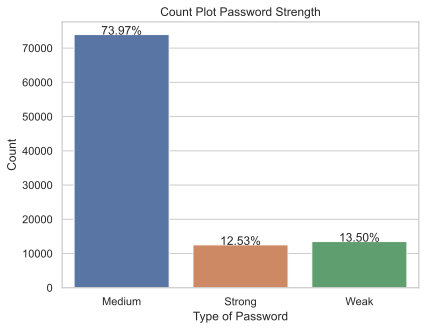

In [19]:
# Create a count plot of password strengths
ax = sns.countplot(data=df, x='strength', hue='strength')

# Get the total count of data points
total = float(len(df))

# Annotate each bar with the percentage it represents
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.,
            height + 3,
            '{:.2f}%'.format((height / total) * 100),
            ha="center")

# Set labels and title
plt.xlabel('Type of Password') 
plt.ylabel('Count') 
plt.title('Count Plot Password Strength')  

# Show the plot
plt.show()

The provided dataset contains over 70% of passwords categorized as 'Medium'.

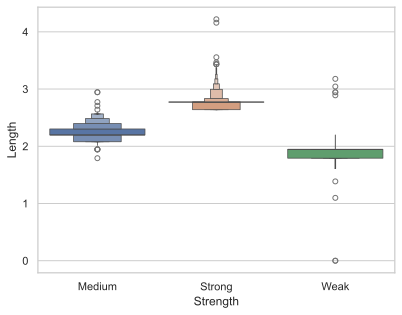

In [20]:
# Add a new column to the DataFrame containing the natural logarithm of the password length
df['log_length'] = np.log(df['length'])

# Create a boxen plot of log-transformed password lengths
sns.boxenplot(data=df, x='strength', y='log_length', hue='strength')

# Set labels for the axes
plt.ylabel('Length')
plt.xlabel('Strength')

# Show the plot
plt.show()

This graph illustrates the relationship between the strength of a password and its length.

In [21]:
# Create a new DataFrame by sampling 30% of the rows from the original DataFrame
df_sample = df.sample(frac=0.30)

# Create a scatter plot with a linear regression line
sns.lmplot(data=df_sample, x='special_sign', y='log_length', hue='strength', scatter_kws={'alpha':0.5})

# Show the plot
plt.show()

This graph demonstrates the correlation between password length, the presence of special characters, and password strength.

In [22]:
# Create a new DataFrame by sampling 30% of the rows from the original DataFrame
df_sample = df.sample(frac=0.30)

# Create a scatter plot with a linear regression line
sns.lmplot(data=df_sample, x='uniques_index', y='log_length', hue='strength', scatter_kws={'alpha':0.5})

# Show the plot
plt.show()

This graph illustrates the relationship between password length, password uniqueness index, and password strength.

In [23]:
df.dtypes

password          object
strength          object
length             int64
special_sign     float64
isalpha             bool
isupper             bool
istitle             bool
islower             bool
isnumeric           bool
uniques_index    float64
log_length       float64
dtype: object

In [24]:
# List of string functions to apply to each password
my_func = ['isalpha', 'isupper', 'istitle', 'islower', 'isnumeric']

# Group by 'strength' and calculate the mean of each function in my_func for each group
func_means = df.groupby('strength')[my_func].mean()

# Group by 'strength' and calculate the mean of 'uniques_index' for each group
uniques_index_mean = df.groupby('strength').agg(uniques_index_mean=('uniques_index', 'mean'))

# Group by 'strength' and calculate the mean of 'length' for each group
length_mean = df.groupby('strength').agg(length_mean=('length', 'mean'))

# Group by 'strength' and calculate the mean of 'special_sign' for each group
special_sign_mean = df.groupby('strength').agg(special_sign_mean=('special_sign', 'mean'))

# Concatenate all the results along the columns axis
pd.concat([func_means, uniques_index_mean, length_mean, special_sign_mean], axis=1)


,isalpha,isupper,istitle,islower,isnumeric,uniques_index_mean,length_mean,special_sign_mean
strength,,,,,,,,
Medium,0.000014,0.017620,0.003894,0.979135,0.000270,0.854070,9.617590,0.001752
Strong,0.000000,0.002715,0.048862,0.077685,0.000000,0.863633,15.922794,0.013671
Weak,0.002891,0.018678,0.001112,0.975022,0.002001,0.879788,6.555663,0.003223


# <a id='fifth'></a> Conclusion

Analyzing the dataset reveals several key observations:

1. **Length and Complexity**:
   - Strong passwords, on average, are notably longer than medium and weak passwords. The average length of strong passwords is 15.93 characters, whereas weak passwords average only 6.55 characters.
   - This difference in length suggests that users tend to create longer and more complex passwords when aiming for stronger security measures.

2. **Diversity in Character Composition**:
   - Strong passwords demonstrate a diverse composition of character types, including uppercase, lowercase, title case, numeric, and special characters.
   - Specifically, strong passwords contain a higher proportion of title case characters (5.33%) compared to medium (0.35%) and weak (0.15%) passwords.
   - Additionally, strong passwords exhibit a greater presence of special characters, with an average of 1.41% of characters being special, compared to only 0.18% in medium passwords and 0.30% in weak passwords.
   - This diversity in character composition enhances the complexity and randomness of strong passwords, making them more resistant to dictionary-based and brute-force attacks.

3. **Uniqueness of Characters**:
   - Strong passwords also demonstrate a higher proportion of unique characters compared to medium and weak passwords.
   - The average uniqueness index of strong passwords is 13.75%, indicating a higher degree of character diversity compared to medium passwords (14.53%) and weak passwords (11.97%).
   - This uniqueness contributes to the overall complexity and unpredictability of strong passwords, further enhancing their security.

**Conclusion:**
The data highlights that strong passwords are characterized by their length, diversity in character composition, and uniqueness of characters. Encouraging users to create longer passwords with a diverse mix of character types, including uppercase, lowercase, special characters, and numbers, is essential for bolstering online security. By adhering to recommended security practices and understanding the importance of password complexity, users can mitigate the risk of unauthorized access and enhance their overall cybersecurity posture.

# <a id='sixth'></a> Data Splitting

In [25]:
def word(password):
    """
    Extracts individual characters from a password and returns them as a list.

    Parameters:
        password (str): The input password.

    Returns:
        list: A list containing individual characters from the password.
    """
    chars = []  # Initialize an empty list to store characters
    for i in password:
        chars.append(i)  # Append each character to the list
    return chars


In [26]:
# Convert the 'password' column to a numpy array
x = np.array(df['password'])

# Convert the 'strength' column to a numpy array
y = np.array(df['strength'])

# Initialize a TF-IDF vectorizer with a custom tokenizer function
tdif = TfidfVectorizer(tokenizer=word)

# Transform the passwords into TF-IDF features and convert to an array
x = tdif.fit_transform(x).toarray()

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.10, random_state=42)

# <a id='seventh'></a> Model Training

In [27]:
# Initialize a Random Forest classifier
model = RandomForestClassifier()

# Use tqdm to display a progress bar while training
with tqdm(desc="Training", total=100) as pbar:
    # Fit the model to the training data
    model.fit(x_train, y_train)
    
    # Update the progress bar to completion
    pbar.update(100)

Training:   0%|          | 0/100 [00:00<?, ?it/s]

Training: 100%|██████████| 100/100 [00:26<00:00,  3.73it/s]


# <a id='eighth'></a> Model Evaluation

In [28]:

# Predict labels for the testing data
y_pred = model.predict(x_test)

# Calculate the weighted F1-score
f1 = f1_score(y_test, y_pred, average='weighted')

# Print the weighted F1-score
print("Weighted F1-Score:", f1)


Weighted F1-Score: 0.930942318550793


In [29]:
accuracy = model.score(x_test, y_test)
print("Accuracy:", accuracy)


Accuracy: 0.9336801040312094


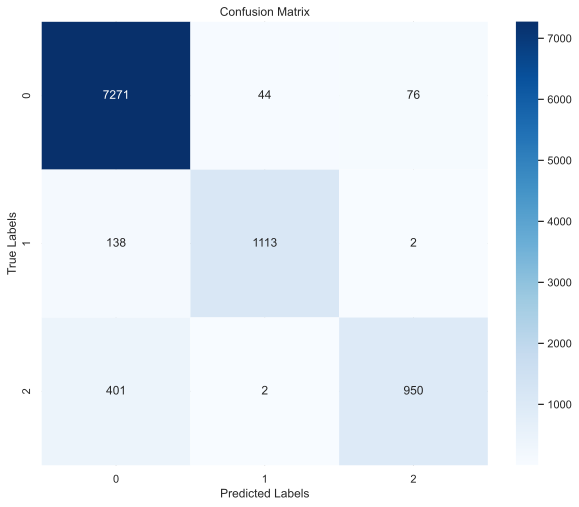

In [30]:
# Predict labels for the testing data
y_pred = model.predict(x_test)

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


In [31]:
import getpass  

# Ask for user input without displaying the entered password
user = getpass.getpass("Enter Password: ") 

# Ensure that tdif is fitted with the same vocabulary as used during training
# Assuming tdif is the TF-IDF vectorizer used during training
tdif.fit(df['password'])

# Transform the user input using the fitted vectorizer and convert it to an array
data = tdif.transform([user]).toarray()  

# Use the trained model to predict the strength of the input password
output = model.predict(data)  

# Print the predicted output
print(output)
  

['Weak']


In [32]:
!pip freeze > requirements.txt


In [33]:
!python3 --version

Python 3.11.7


In [34]:
!which python3

/Users/sergey/.pyenv/versions/3.11.7/bin/python3
